<a href="https://colab.research.google.com/github/gon2gon2/first/blob/master/COVID19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##  필요한 패키지 설치와 호출
- pycountry_convert: 국가에 대한 이름, 고유 번호 및 코드들 간의 변환을 도와줌
- folium: 지도
- plotly: 훨씬 보기 좋은 시각화

In [0]:
!pip install pycountry_convert
!pip install folium
!pip install plotly

  Created wheel for pycountry: filename=pycountry-19.8.18-py2.py3-none-any.whl size=10627366 sha256=be32cbf152281627e19f8c54647efc8c3a06bae70cfd78dc71a2db905e564762
  Stored in directory: c:\users\fizz5\appdata\local\pip\cache\wheels\00\77\65\5f318c3c30b046b450a385ecfc690125f8a270cdb0f3f483b4
Successfully built pycountry


ERROR: pytest-astropy 0.8.0 requires pytest-filter-subpackage>=0.1, which is not installed.


  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11435 sha256=652ad6565d0e723176e806688bda48dbcb64514c6e8eedb07c8abaecd0249910
  Stored in directory: c:\users\fizz5\appdata\local\pip\cache\wheels\f9\8d\8d\f6af3f7f9eea3553bc2fe6d53e4b287dad18b06a861ac56ddf
Successfully built retrying


In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker 
import pycountry_convert as pc
import folium
import branca
from datetime import datetime, timedelta,date
from scipy.interpolate import make_interp_spline, BSpline
import plotly.express as px
import json, requests


%matplotlib inline

## 크롤링으로 데이터 가져옴

In [0]:
import pandas as pd
import requests
from bs4 import BeautifulSoup

req = requests.get('https://www.worldometers.info/coronavirus/')
soup = BeautifulSoup(req.text, "lxml")  #lxml 파서를 이용해서 beatufulsoup 객체로 변환

df_country = soup.find('div',attrs={"id" : "nav-tabContent"}).find('table',attrs={"id" : "main_table_countries_today"}).find_all('tr')
#nav-tabContent는 표 전체, 그 속에서 main_table_countries_today를 찾고, 그 안에서 모든 tr태그를 찾는다 =>각 나라별 데이터 수집
arrCountry = []

print(df_country[3])

<tr class="total_row_world row_continent" data-continent="Asia" style="display: none">
<td style="text-align:left;">
<nobr>Asia</nobr>
</td>
<td>287,318</td>
<td>+134</td>
<td>10,600</td>
<td>+3</td>
<td>142,635</td>
<td>134,083</td>
<td>6,624</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td data-continent="Asia" style="display:none;">Asia</td>
</tr>


In [0]:
for i in range(8,len(df_country)-1):             #for i in range(8,228):
    tmp = df_country[i].find_all('td')
    if (tmp[0].string.find('<a') == -1):
        country = [tmp[0].string]
    else:
        country = [tmp[0].a.string] # Country
    for j in range(1,12):
        if (str(tmp[j].string) == 'None' or str(tmp[j].string) == ' '):
            country = country + [0]
        else:
            country = country + [float(tmp[j].string.replace(',','').replace('+',''))]
    arrCountry.append(country)
df_worlddata = pd.DataFrame(arrCountry)
df_worlddata.columns = ['Country','Total Cases','Cases','Total Deaths','Deaths','Total Recovers','Active','Serious Critical',
                         'Total Cases/1M pop','Deaths/1M pop','Total Test','Tests/1M pop']
for i in range(0,len(df_worlddata)):
    df_worlddata['Country'].iloc[i] = df_worlddata['Country'].iloc[i].strip()

C:\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [0]:
df_worlddata.head()

,Country,Total Cases,Cases,Total Deaths,Deaths,Total Recovers,Active,Serious Critical,Total Cases/1M pop,Deaths/1M pop,Total Test,Tests/1M pop
0,World,1780315.0,572.0,108828.0,49.0,404031.0,1267456.0,50592.0,228.0,14.0,0.0,0.0
1,USA,532879.0,0.0,20577.0,0.0,30453.0,481849.0,11471.0,1610.0,62.0,2670674.0,8068.0
2,Spain,163027.0,0.0,16606.0,0.0,59109.0,87312.0,7371.0,3487.0,355.0,355000.0,7593.0
3,Italy,152271.0,0.0,19468.0,0.0,32534.0,100269.0,3381.0,2518.0,322.0,963473.0,15935.0
4,France,129654.0,0.0,13832.0,0.0,26391.0,89431.0,6883.0,1986.0,212.0,333807.0,5114.0


In [0]:
test = pd.read_csv("test.csv")
train = pd.read_csv("train.csv")

In [0]:
train.head(10)

,Id,Province_State,Country_Region,Date,ConfirmedCases,Fatalities
0,1,NaN,Afghanistan,2020-01-22,0.0,0.0
1,2,NaN,Afghanistan,2020-01-23,0.0,0.0
2,3,NaN,Afghanistan,2020-01-24,0.0,0.0
3,4,NaN,Afghanistan,2020-01-25,0.0,0.0
4,5,NaN,Afghanistan,2020-01-26,0.0,0.0
5,6,NaN,Afghanistan,2020-01-27,0.0,0.0
6,7,NaN,Afghanistan,2020-01-28,0.0,0.0
7,8,NaN,Afghanistan,2020-01-29,0.0,0.0
8,9,NaN,Afghanistan,2020-01-30,0.0,0.0
9,10,NaN,Afghanistan,2020-01-31,0.0,0.0


#### matplotlib의 background_gradient
DataFrame.background_gradient(cmap='PuBu', low=0, high=0, axis=0, subset=None)

In [0]:
#비교를 위한 시각화
df_worlddata.style.background_gradient(cmap='Wistia')

In [0]:
df_worlddata = df_worlddata[df_worlddata.Country != 'World']
df_worlddata.index = df_worlddata["Country"]  #원래 숫자였던 index를 국가이름으로 바꿔줌
df_worlddata = df_worlddata.drop(['Country'],axis=1)

첫째줄

In [0]:
#참고1 drop을 했더니 사라지기만 했음, world가 최댓값을 먹고 튐
#사실 밑에 World가 겁나 많았다
df_worlddata = df_worlddata.drop(0,0)
df_worlddata.style.background_gradient(cmap='Wistia')

In [0]:
#참고2 그래서 drop이 아닌 !=을 쓴 것
df_worlddata = df_worlddata[df_worlddata.Country != 'World']
df_worlddata.style.background_gradient(cmap='Wistia')

둘째줄 실행 전

In [0]:
#index가 숫자였음
df_worlddata

,Country,Total Cases,Cases,Total Deaths,Deaths,Total Recovers,Active,Serious Critical,Total Cases/1M pop,Deaths/1M pop,Total Test,Tests/1M pop
1,USA,503177.0,301.0,18761.0,14.0,27314.0,457102.0,10917.0,1520.0,57.0,2538888.0,7670.0
2,Spain,161852.0,3579.0,16353.0,272.0,59109.0,86390.0,7371.0,3462.0,350.0,355000.0,7593.0
3,Italy,147577.0,0.0,18849.0,0.0,30455.0,98273.0,3497.0,2441.0,312.0,906864.0,14999.0
4,France,124869.0,0.0,13197.0,0.0,24932.0,86740.0,7004.0,1913.0,202.0,333807.0,5114.0
5,Germany,122530.0,359.0,2736.0,0.0,53913.0,65881.0,4895.0,1462.0,33.0,1317887.0,15730.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1975,Total:,279601.0,4560.0,10431.0,207.0,141309.0,127861.0,6653.0,0.0,0.0,0.0,0.0
1976,Total:,45165.0,189.0,1816.0,7.0,4627.0,38722.0,877.0,0.0,0.0,0.0,0.0
1977,Total:,7691.0,83.0,60.0,4.0,3688.0,3943.0,85.0,0.0,0.0,0.0,0.0
1978,Total:,13683.0,144.0,701.0,4.0,2298.0,10684.0,159.0,0.0,0.0,0.0,0.0


둘째줄 실행 후

In [0]:
#index가 국가이름으로 바뀜
df_worlddata

,Country,Total Cases,Cases,Total Deaths,Deaths,Total Recovers,Active,Serious Critical,Total Cases/1M pop,Deaths/1M pop,Total Test,Tests/1M pop
Country,,,,,,,,,,,,
USA,USA,503177.0,301.0,18761.0,14.0,27314.0,457102.0,10917.0,1520.0,57.0,2538888.0,7670.0
Spain,Spain,161852.0,3579.0,16353.0,272.0,59109.0,86390.0,7371.0,3462.0,350.0,355000.0,7593.0
Italy,Italy,147577.0,0.0,18849.0,0.0,30455.0,98273.0,3497.0,2441.0,312.0,906864.0,14999.0
France,France,124869.0,0.0,13197.0,0.0,24932.0,86740.0,7004.0,1913.0,202.0,333807.0,5114.0
Germany,Germany,122530.0,359.0,2736.0,0.0,53913.0,65881.0,4895.0,1462.0,33.0,1317887.0,15730.0
...,...,...,...,...,...,...,...,...,...,...,...,...
Total:,Total:,279601.0,4560.0,10431.0,207.0,141309.0,127861.0,6653.0,0.0,0.0,0.0,0.0
Total:,Total:,45165.0,189.0,1816.0,7.0,4627.0,38722.0,877.0,0.0,0.0,0.0,0.0
Total:,Total:,7691.0,83.0,60.0,4.0,3688.0,3943.0,85.0,0.0,0.0,0.0,0.0


셋째줄

In [0]:
df_worlddata

,Total Cases,Cases,Total Deaths,Deaths,Total Recovers,Active,Serious Critical,Total Cases/1M pop,Deaths/1M pop,Total Test,Tests/1M pop
Country,,,,,,,,,,,
USA,503177.0,301.0,18761.0,14.0,27314.0,457102.0,10917.0,1520.0,57.0,2538888.0,7670.0
Spain,161852.0,3579.0,16353.0,272.0,59109.0,86390.0,7371.0,3462.0,350.0,355000.0,7593.0
Italy,147577.0,0.0,18849.0,0.0,30455.0,98273.0,3497.0,2441.0,312.0,906864.0,14999.0
France,124869.0,0.0,13197.0,0.0,24932.0,86740.0,7004.0,1913.0,202.0,333807.0,5114.0
Germany,122530.0,359.0,2736.0,0.0,53913.0,65881.0,4895.0,1462.0,33.0,1317887.0,15730.0
...,...,...,...,...,...,...,...,...,...,...,...
Total:,279601.0,4560.0,10431.0,207.0,141309.0,127861.0,6653.0,0.0,0.0,0.0,0.0
Total:,45165.0,189.0,1816.0,7.0,4627.0,38722.0,877.0,0.0,0.0,0.0,0.0
Total:,7691.0,83.0,60.0,4.0,3688.0,3943.0,85.0,0.0,0.0,0.0,0.0


## 새로운 test셋을 만들고, 시각화

In [0]:
df_test = df_worlddata.drop(['Total Cases', 'Cases', 'Total Deaths', 'Deaths', 'Total Recovers', 'Active', "Serious Critical", 'Total Cases/1M pop','Deaths/1M pop'],axis=1)
df_test.head()

,Total Test,Tests/1M pop
Country,,
USA,2670674.0,8068.0
Spain,355000.0,7593.0
Italy,963473.0,15935.0
France,333807.0,5114.0
Germany,1317887.0,15730.0


### 검진 수를 기준으로 시각화

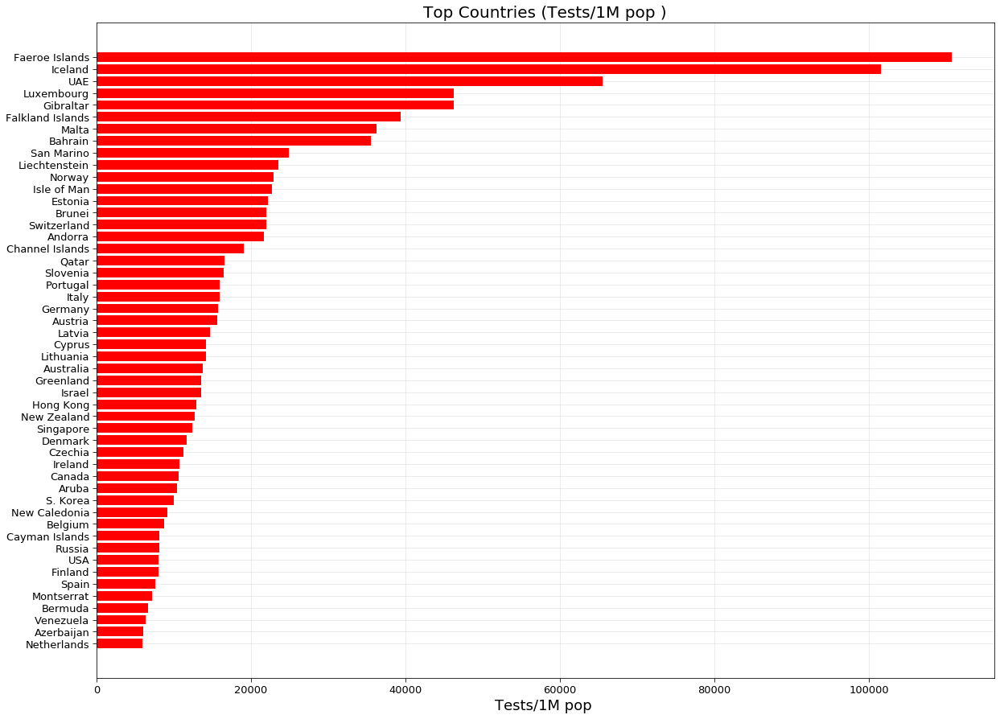

In [0]:
f = plt.figure(figsize = (20,15))   #20 x 15 사이즈의 텅 빈 도화지를 만들고
f.add_subplot(111)        #add_subplot(n,m,l)  n x m 그리드에 l번째 subplot

plt.axes(axisbelow=True) #그래프의 투명도(opacity)를 조절해서 뒤의 격자를 보이게 할 것이냐 여부, 집중해야 보임

plt.barh(df_test.sort_values('Tests/1M pop')["Tests/1M pop"].index[-50:],   #x축     #Tests/1M pop을 기준으로 정렬하고 
         df_test.sort_values('Tests/1M pop')["Tests/1M pop"].values[-50:],  #y축
         color="red")

plt.tick_params(size=5,labelsize = 13)            #size는 그래프랑 글자 거리  #label size는 범례(글자 숫자) 크기

plt.xlabel("Tests/1M pop ",fontsize=18)           #x축 이름

plt.title("Top Countries (Tests/1M pop )",fontsize=20) #제목

plt.grid(alpha=0.3)                                 #그리드의 투명도 설정 0~1


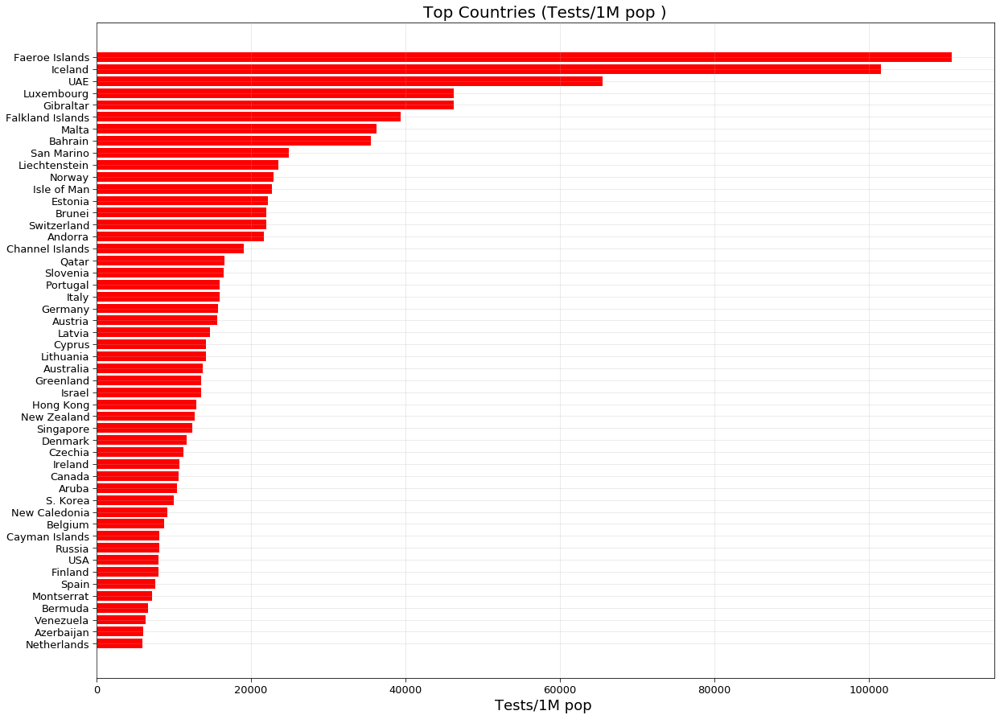

In [0]:
f = plt.figure(figsize = (20,15))   #20 x 15 사이즈의 텅 빈 도화지를 만들고
f.add_subplot(111)        #add_subplot(n,m,l)  n x m 그리드에 l번째 subplot

plt.axes(axisbelow = False) #그래프의 투명도(opacity)를 조절해서 뒤의 격자를 보이게 할 것이냐 여부, 집중해야 보임

plt.barh(df_test.sort_values('Tests/1M pop')["Tests/1M pop"].index[-50:],   #x축     #Tests/1M pop을 기준으로 정렬하고 
         df_test.sort_values('Tests/1M pop')["Tests/1M pop"].values[-50:],  #y축
         color="red")

plt.tick_params(size=5,labelsize = 13)            #size는 그래프랑 글자 거리  #label size는 범례(글자 숫자) 크기

plt.xlabel("Tests/1M pop ",fontsize=18)           #x축 이름

plt.title("Top Countries (Tests/1M pop )",fontsize=20) #제목

plt.grid(alpha=0.3)                                 #그리드의 투명도 설정 0~1

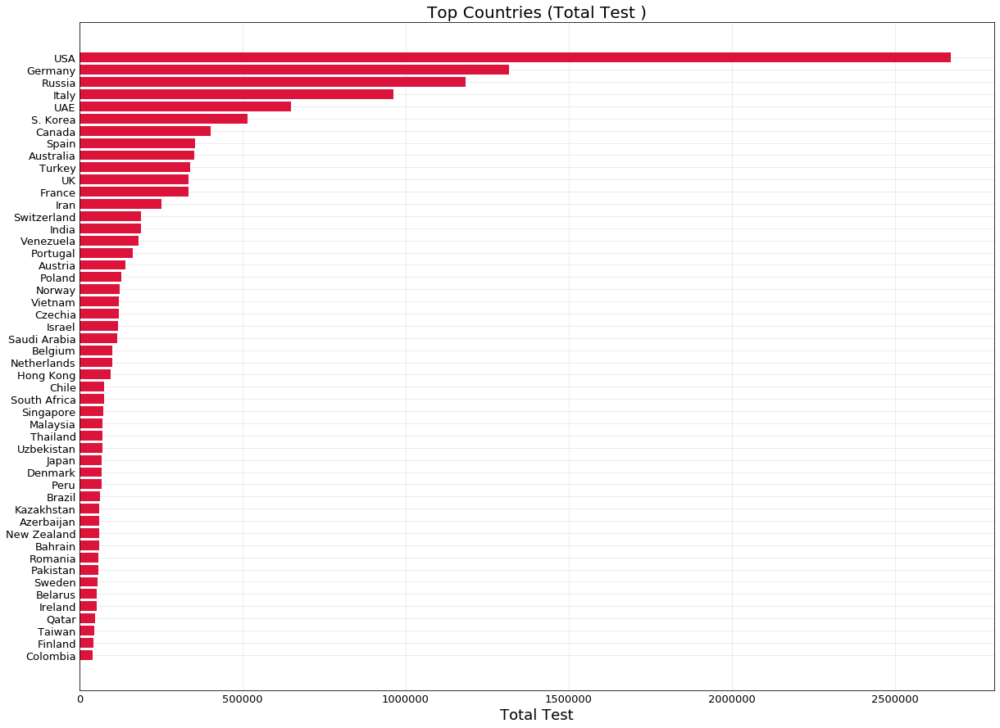

In [0]:
f = plt.figure(figsize = (20,15))
f.add_subplot(111)
plt.axes(axisbelow=True)
plt.barh(df_test.sort_values('Total Test')["Total Test"].index[-50:],
         df_test.sort_values('Total Test')["Total Test"].values[-50:],
         color='crimson')
plt.tick_params(size = 0.5, labelsize= 13)
plt.xlabel("Total Test",fontsize=18)
plt.title("Top Countries (Total Test )",fontsize=20)
plt.grid(alpha=0.3)

1. USA는 검사 수가 많아서 확진자 수가 많다.
2. India도 시험 횟수를 늘리고 있다.(작성자가 인도 사람)
3. 한국은 확진자 적은 데도 테스트 수가 엄청 많고, 그 덕에 9000의 확진자 이후 곡선을 평평하게 만들 수 있었음

이번엔 Total Cases로 확인하겠음

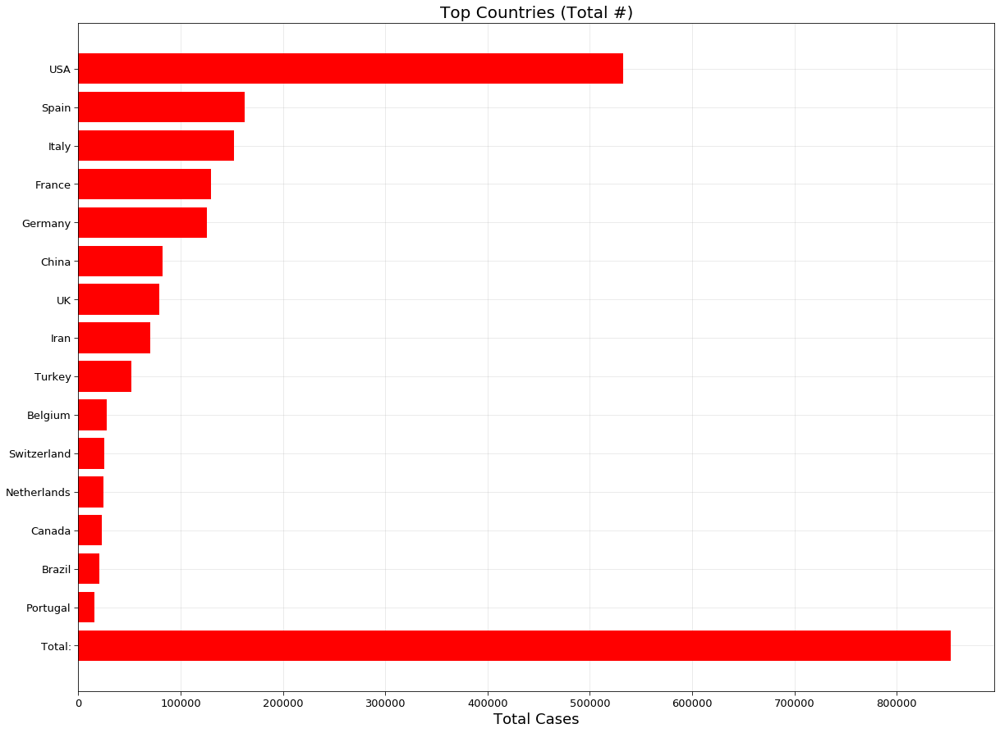

In [0]:
f = plt.figure(figsize=(20,15))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_worlddata.sort_values('Total Cases')["Total Cases"].index[-20:],
         df_worlddata.sort_values('Total Cases')["Total Cases"].values[-20:],
         color="red")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Total Cases",fontsize=18)
plt.title("Top Countries (Total #)",fontsize=20)
plt.grid(alpha=0.3)

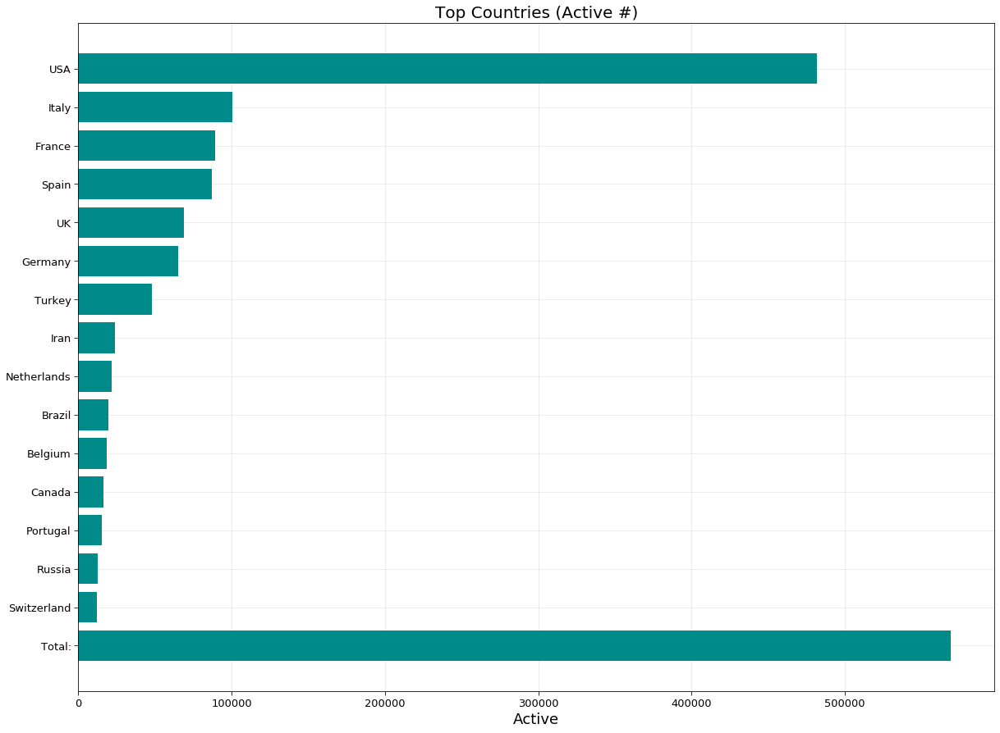

In [0]:
f = plt.figure(figsize=(20,15))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_worlddata.sort_values('Active')["Active"].index[-20:],
         df_worlddata.sort_values('Active')["Active"].values[-20:],
         color="darkcyan")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Active",fontsize=18)
plt.title("Top Countries (Active #)",fontsize=20)
plt.grid(alpha=0.3)

이제 critical cases를 확인해보자
1. 미래의 사망자 수를 잘 보여줄 것이기 때문에 중요하다.
2. 미국은 더 많은 critical cases가 늘어감에 따라, 사망자 수도 늘어갈 것임.
3. 프랑스와 스페인도 미국 따라감.

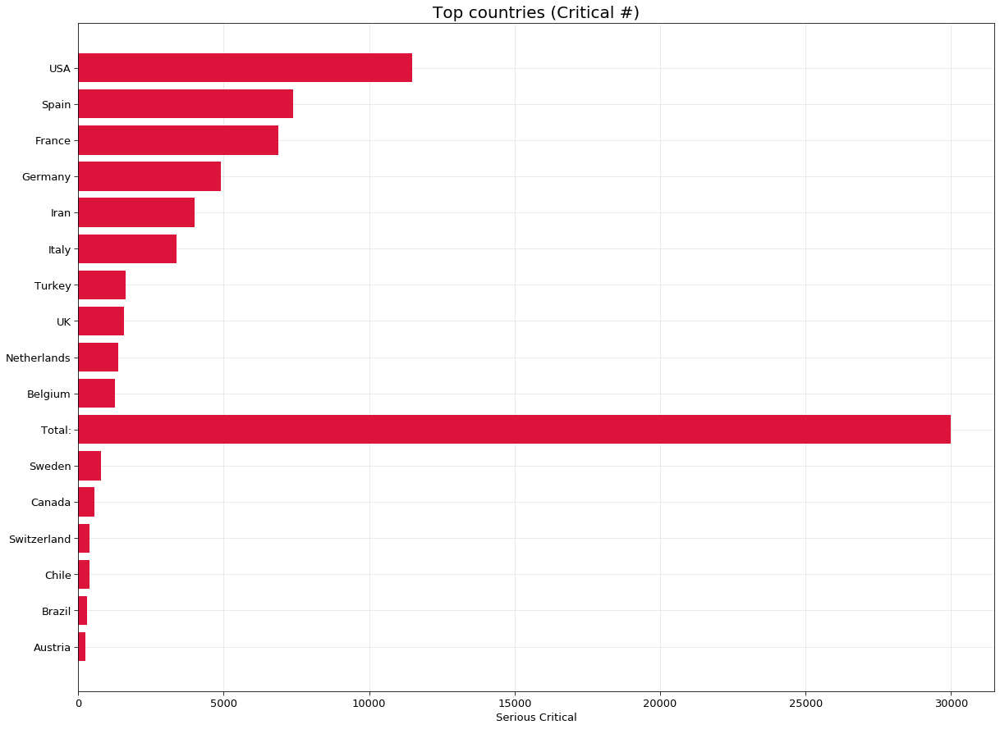

In [0]:
f = plt.figure(figsize = (20, 15))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_worlddata.sort_values('Serious Critical')['Serious Critical'].index[-20:],
         df_worlddata.sort_values('Serious Critical')['Serious Critical'].values[-20:],
         color="crimson")
plt.tick_params(size=5, labelsize = 13)
plt.xlabel("Serious Critical", fontsize = 13)
plt.title("Top countries (Critical #)", fontsize = 20)
plt. grid(alpha=0.3)

In [0]:
df_worlddata.head()

,Total Cases,Cases,Total Deaths,Deaths,Total Recovers,Active,Serious Critical,Total Cases/1M pop,Deaths/1M pop,Total Test,Tests/1M pop
Country,,,,,,,,,,,
USA,532879.0,0.0,20577.0,0.0,30453.0,481849.0,11471.0,1610.0,62.0,2670674.0,8068.0
Spain,163027.0,0.0,16606.0,0.0,59109.0,87312.0,7371.0,3487.0,355.0,355000.0,7593.0
Italy,152271.0,0.0,19468.0,0.0,32534.0,100269.0,3381.0,2518.0,322.0,963473.0,15935.0
France,129654.0,0.0,13832.0,0.0,26391.0,89431.0,6883.0,1986.0,212.0,333807.0,5114.0
Germany,125452.0,0.0,2871.0,0.0,57400.0,65181.0,4895.0,1497.0,34.0,1317887.0,15730.0


In [0]:
# 데이터 검색(확진자 수, 사망자 수)
confirmed = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deaths = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')

# Depricated   deprecated 반대된 거부된
# df_recovered = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_19-covid-Recovered.csv')
recovered = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv")

In [0]:
covid_country = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv")

pandas 칼럼명 변경하기
pandas.rename(columns = {'old_name' : 'new_name'})

In [0]:
confirmed = confirmed.rename(columns={"Province/State":"state","Country/Region": "country"})
deaths = deaths.rename(columns={"Province/State":"state","Country/Region": "country"})
recovered = recovered.rename(columns={"Province/State":"state","Country/Region": "country"})
covid_country = covid_country.rename(columns={"Country_Region": "country"})
covid_country["Active"] = covid_country["Confirmed"]-covid_country["Recovered"]-covid_country["Deaths"]

In [0]:
confirmed.head(),deaths.head(),covid_country.head(),recovered.head()

(  state      country      Lat     Long  1/22/20  1/23/20  1/24/20  1/25/20  \
 0   NaN  Afghanistan  33.0000  65.0000        0        0        0        0   
 1   NaN      Albania  41.1533  20.1683        0        0        0        0   
 2   NaN      Algeria  28.0339   1.6596        0        0        0        0   
 3   NaN      Andorra  42.5063   1.5218        0        0        0        0   
 4   NaN       Angola -11.2027  17.8739        0        0        0        0   
 
    1/26/20  1/27/20  ...  4/2/20  4/3/20  4/4/20  4/5/20  4/6/20  4/7/20  \
 0        0        0  ...     273     281     299     349     367     423   
 1        0        0  ...     277     304     333     361     377     383   
 2        0        0  ...     986    1171    1251    1320    1423    1468   
 3        0        0  ...     428     439     466     501     525     545   
 4        0        0  ...       8       8      10      14      16      17   
 
    4/8/20  4/9/20  4/10/20  4/11/20  
 0     444     484   

In [0]:
# 플롯의 패러미터들을 설정해주는 함수
def plot_params(ax,axis_label= None, plt_title = None,label_size=15, axis_fsize = 15, title_fsize = 20, scale = 'linear' ):
    #
    # Tick-Parameters
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())       #주 눈금선
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())       #보조 눈금선
    ax.tick_params(which='both', width=1,labelsize=label_size)  #tick_params() 틱 레이블, 그리드 라인 수정
    ax.tick_params(which='major', length=6)                     #which={'major', 'minor', 'both'}
    ax.tick_params(which='minor', length=3, color='0.8')
    
    # Grid
    plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')      #lw 선 굵기, ls 선 스타일
    plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')      #c는 색깔

    # Plot Title
    plt.title( plt_title,{'fontsize':title_fsize})              #plt title은 입력 받음
    
    # Yaxis sacle
    plt.yscale(scale)                                           #축의 스케일 (linear, log, symlog, logit)
    plt.minorticks_on()                                         #축에 보조눈금선을 표시함
    # Plot Axes Labels
    xl = plt.xlabel(axis_label[0],fontsize = axis_fsize)        
    yl = plt.ylabel(axis_label[1],fontsize = axis_fsize)

In [0]:
#코로나 바이러스 확진 시각화
def visualize_covid_cases(confirmed, deaths, continent=None , country = None , state = None, period = None, figure = None, scale = "linear"):
    x = 0
 #---------------------------------------------------------------------------------------------------------
    if figure == None:   #default일 경우
        f = plt.figure(figsize=(10,10))
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths]
    label = ["Confirmed", "Deaths"]
#-----------------------------------------------------------------------------------------------------------
    
    if continent != None:               #continent에 값을 입력했을 시, 패러미터는 대륙으로
        params = ["continent",continent]
    elif country != None:               #continent말고 country에 값을 입력했을 시, 패러미터는 국가로
        params = ["country",country]
    else: 
        params = ["All", "All"]         
    color = ["darkcyan","crimson"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    
#-----------------------------------------------------------------------------------------------------------
    for i,stat in enumerate(stats):
        if params[1] == "All" :          #위에서 설정한 params의 값이 all이라면
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]    #iloc는 integer, loc는 label
        else :                             #축을 0으로 해서 더한다                   
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)

    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
#-----------------------------------------------------------------------------------------------------------
    text = "From "+stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Mortality rate : "+ str(int(Total_deaths[-1]/(Total_confirmed[-1])*10000)/100)+"\n"
    text += "Last 5 Days:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-6])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-6])+"\n"
    text += "Last 24 Hours:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
#-----------------------------------------------------------------------------------------------------------
    # Plot Axes Labels
    axis_label = ["Days ("+confirmed.columns[5]+" - "+confirmed.columns[-1]+")","No of Cases"]
    
    # Plot Parameters
    plot_params(ax,axis_label,scale = scale)
    
    # Plot Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19 Cases for "+params[1] ,{'fontsize':25})
#-----------------------------------------------------------------------------------------------------------     
    # Legend Location
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()

In [0]:
#총 확진자 수
def get_total_cases(cases, country = "All"):
    if(country == "All") :     #디폴트(All)일 경우
        return np.sum(np.asarray(cases.iloc[:,5:]),axis = 0)[-1]
    else :                     #나라를 지정할 경우
        return np.sum(np.asarray(cases[cases["country"] == country].iloc[:,5:]),axis = 0)[-1]
    

In [0]:
#사망률
def get_mortality_rate(confirmed,deaths, continent = None, country = None):
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else :
        params = ["All", "All"]
    
    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(confirmed.iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths.iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/Total_confirmed)*100,2)
    else :
        Total_confirmed =  np.sum(np.asarray(confirmed[confirmed[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths[deaths[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/Total_confirmed)*100,2)
    
    return np.nan_to_num(mortality_rate)

In [0]:
def dd(date1,date2):
    return (datetime.strptime(date1,'%m/%d/%y') - datetime.strptime(date2,'%m/%d/%y')).days


#out = "output/"

In [0]:
country_df

,Confirmed,Deaths,Recovered,Active
country,,,,
Australia,6303,57,1806,4440
Austria,13806,337,6604,6865
Canada,23316,654,6650,16012
China,83014,3343,77877,1794
Denmark,6191,260,2111,3820
...,...,...,...,...
West Bank and Gaza,268,2,57,209
Western Sahara,6,0,0,6
Yemen,1,0,0,1


In [0]:
country_df = covid_country.copy().drop(['Lat','Long_','Last_Update'],axis =1)
country_df.index = country_df["country"]
country_df = country_df.drop(['country'],axis=1)

In [0]:
country_df

,Confirmed,Deaths,Recovered,Active
country,,,,
Australia,6303,57,1806,4440
Austria,13806,337,6604,6865
Canada,23316,654,6650,16012
China,83014,3343,77877,1794
Denmark,6191,260,2111,3820
...,...,...,...,...
West Bank and Gaza,268,2,57,209
Western Sahara,6,0,0,6
Yemen,1,0,0,1


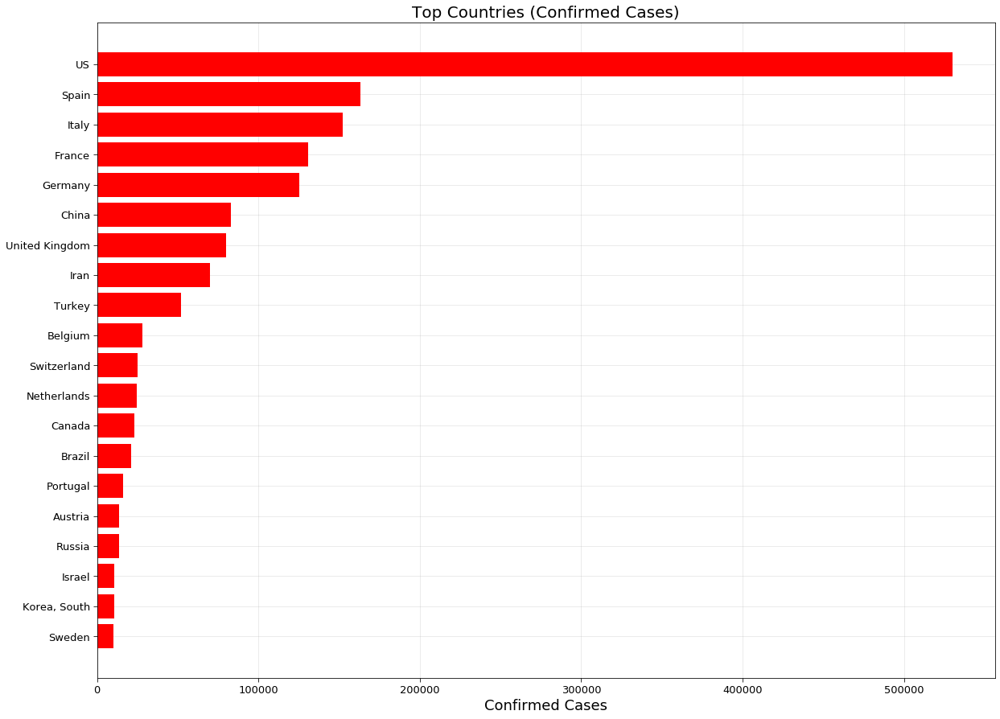

In [0]:
f = plt.figure(figsize=(20,15))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(country_df.sort_values('Confirmed')["Confirmed"].index[-20:],
         country_df.sort_values('Confirmed')["Confirmed"].values[-20:],
         color="red")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("Top Countries (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)
#plt.savefig(out+'Top Countries (Confirmed Cases).png')

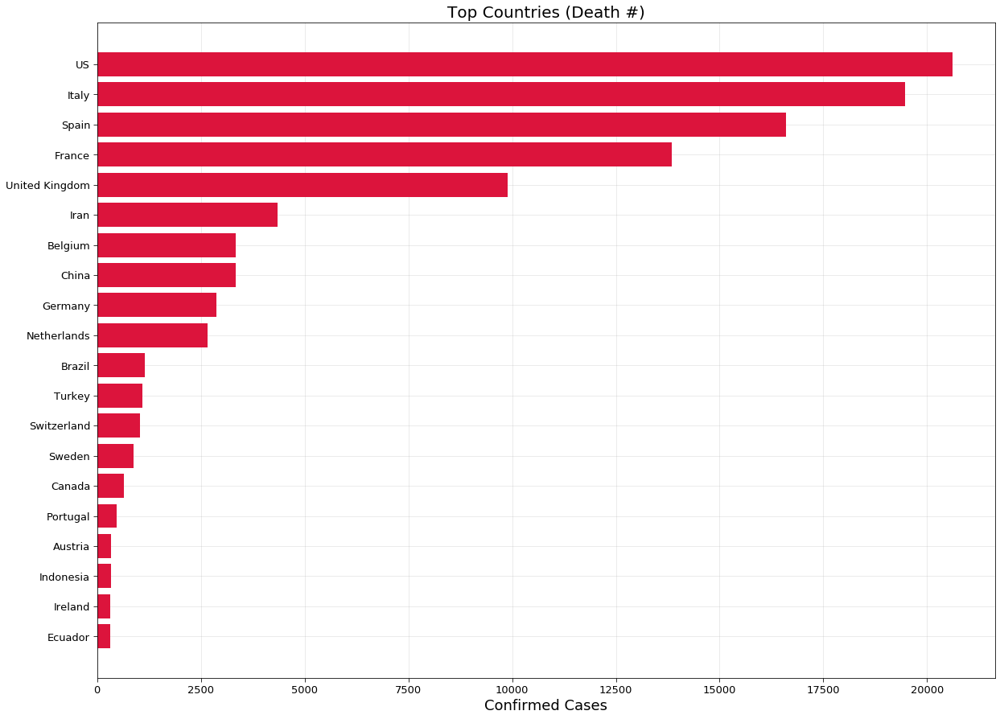

In [0]:
f = plt.figure(figsize=(20,15))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(country_df.sort_values('Deaths')["Deaths"].index[-20:],country_df.sort_values('Deaths')["Deaths"].values[-20:],color="crimson")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("Top Countries (Death #)",fontsize=20)
plt.grid(alpha=0.3)
#plt.savefig(out+'Top Countries (Death #).png')

In [0]:
pd.DataFrame(country_df.sum()).transpose().style.background_gradient(cmap='Wistia',axis=1)

,Confirmed,Deaths,Recovered,Active
0,1777517,108862,404236,1264419


In [0]:
country_df.sort_values('Confirmed', ascending= False).style.background_gradient(cmap='PuBu')

,Confirmed,Deaths,Recovered,Active
country,,,,
US,529887,20604,32001,477282
Spain,163027,16606,59109,87312
Italy,152271,19468,32534,100269
France,130730,13851,26671,90208
Germany,125452,2871,57400,65181
China,83014,3343,77877,1794
United Kingdom,79885,9892,625,69368
Iran,70029,4357,41947,23725
Turkey,52167,1101,2965,48101


In [0]:
#folium을 통해 지도로 시각화
#zoom_start는 처음에 보여지는 배율,
#tiles에는 OpenStreetMap, CartoDB, Mapbox 등등
world_map = folium.Map(location=[10,0], tiles="OpenStreetMap", zoom_start=2,max_zoom=6,min_zoom=2)

for i in range(0,len(confirmed)):
    folium.Circle(
        #location 위도 경도 값, tooltip은 마우스 올렸을 때 표시될 값들
        location=[confirmed.iloc[i]['Lat'], confirmed.iloc[i]['Long']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>"+confirmed.iloc[i]['country']+"</h5>"+
                    "<div style='text-align:center;'>"+str(np.nan_to_num(confirmed.iloc[i]['state']))+"</div>"+
                    "<hr style='margin:10px;'>"+
                    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
        "<li>Confirmed: "+str(confirmed.iloc[i,-1])+"</li>"+
        "<li>Deaths:   "+str(deaths.iloc[i,-1])+"</li>"+
        "<li>Mortality Rate:   "+str(np.round(deaths.iloc[i,-1]/(confirmed.iloc[i,-1]+1.00001)*100,2))+"</li>"+
        "</ul>"
        ,
        radius=(int((np.log(confirmed.iloc[i,-1]+1.00001)))+0.2)*50000,
        color='#ff6600',
        fill_color='#ff8533',
        fill=True).add_to(world_map)

world_map

In [0]:
temp_df = pd.DataFrame(country_df['Confirmed'])
temp_df = temp_df.reset_index()     #기존 인덱스를 행으로 재배열
#px: plotly expess     seaborn처럼 사용할 수 있다
fig = px.choropleth(temp_df, locations="country",
                    color=np.log10(temp_df.iloc[:,-1]),
                    # hover: 허공을 맴돌다
                    hover_name="country", 
                    hover_data=["Confirmed"],
                    color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
fig.update_geos(fitbounds="locations", visible=False)     #True로 하면 값이 없는 곳과 지도 테두리가 생김
fig.update_layout(title_text="Confirmed Cases Heat Map (Log Scale)") #제목 지정
fig.update_coloraxes(colorbar_title="Confirmed Cases(Log Scale)",colorscale="Reds") #Blues,Greens 등등
fig.show()

In [0]:
#위는 확진자, 여기는 사망자
temp_df = pd.DataFrame(country_df['Deaths'])
temp_df = temp_df.reset_index()
fig = px.choropleth(temp_df, locations="country",
                    color=np.log10(temp_df.iloc[:,-1]+1), # lifeExp is a column of gapminder
                    hover_name="country", # column to add to hover information
                    hover_data=["Deaths"],
                    color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text="Deaths Heat Map (Log Scale)")
fig.update_coloraxes(colorbar_title="Deaths (Log Scale)",colorscale="Reds")
fig.show()

In [0]:
#nan인 이유
#파이썬의 None과 같은 숫자가 아닌 타입을 Numpy로 변환하면 nan으로 보인다.
confirmed = confirmed.replace(np.nan, '', regex=True)
deaths = deaths.replace(np.nan, '', regex=True)

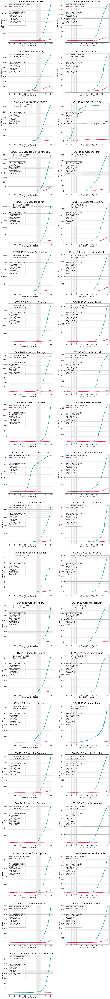

In [0]:
df_countries = confirmed.groupby(["country"]).sum()
df_countries = df_countries.sort_values(df_countries.columns[-1],ascending = False)
countries = df_countries[df_countries[df_countries.columns[-1]] >= 3500].index

cols =2
rows = int(np.ceil(countries.shape[0]/cols))
f = plt.figure(figsize=(20,8*rows))
for i,country in enumerate(countries):
    visualize_covid_cases(confirmed, deaths,country = country,figure = [f,rows,cols, i+1])

plt.show()

In [0]:
temp

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20
country,,,,,,,,,,,,,,,,,,,,,
US,1,1,2,2,5,5,5,5,5,7,...,243762,275586,308853,337072,366667,396223,429052,461437,496535,526396
Spain,0,0,0,0,0,0,0,0,0,0,...,112065,119199,126168,131646,136675,141942,148220,153222,158273,163027
Italy,0,0,0,0,0,0,0,0,0,2,...,115242,119827,124632,128948,132547,135586,139422,143626,147577,152271
France,0,0,2,3,3,3,4,5,5,5,...,59929,65202,90848,93773,98963,110065,113959,118781,125931,130727
Germany,0,0,0,0,0,1,4,4,4,5,...,84794,91159,96092,100123,103374,107663,113296,118181,122171,124908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Western Sahara,0,0,0,0,0,0,0,0,0,0,...,0,0,0,4,4,4,4,4,4,4
South Sudan,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,2,2,3,4,4
Timor-Leste,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,2,2


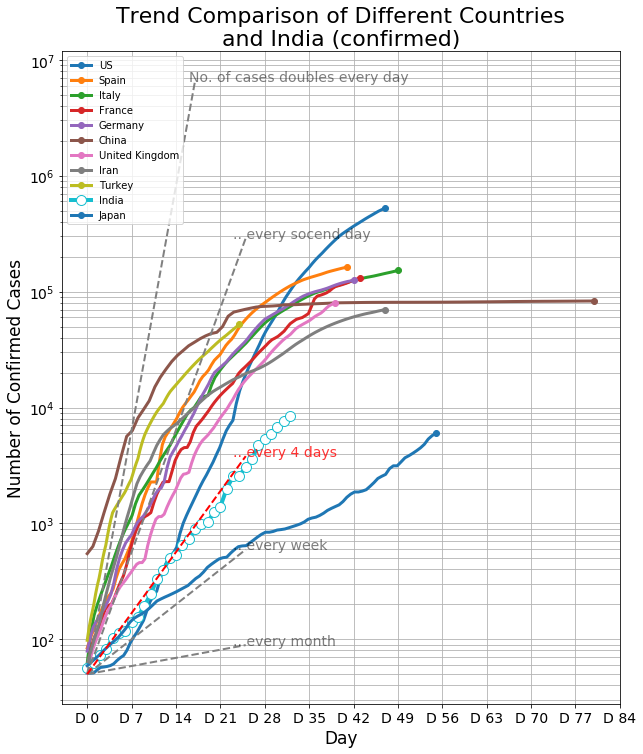

In [0]:
#국가로 groupby 한 뒤에 확진자 수로 정렬
temp = confirmed.groupby('country').sum().drop(["Lat","Long"],axis =1).sort_values(confirmed.columns[-1], ascending= False)

threshold = 50
f = plt.figure(figsize=(10,12))
ax = f.add_subplot(111)
#0~8까지는 계속 뽑고 그 뒤는 일본이랑 인도만 보겠다
for i,country in enumerate(temp.index):
    if i >= 9:
        if country != "India" and country != "Japan" :
            continue
    x = 91
    t = temp.loc[temp.index== country].values[0]
    t = t[t>threshold][:x]
     
    date = np.arange(0,len(t[:x]))
    xnew = np.linspace(date.min(), date.max(), 91)
    spl = make_interp_spline(date, t, k=1)  # type: BSpline
    power_smooth = spl(xnew)
    if country != "India":
        plt.plot(xnew,power_smooth,'-o',label = country,linewidth =3, markevery=[-1])
    else:
        marker_style = dict(linewidth=4, linestyle='-', marker='o',markersize=10, markerfacecolor='#ffffff')
        plt.plot(date,t,"-.",label = country,**marker_style)

plt.tick_params(labelsize = 14)        
plt.xticks(np.arange(0,91,7),[ "D "+str(i) for i in range(91)][::7])     

# Reference lines 
x = np.arange(0,18)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,26)
y = 2**(x/2+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every socend day",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,26)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every week",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,26)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every month",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)


# India is following trend similar to doulbe the cases in 4 days but it may increase the rate 
x = np.arange(0,26)
y = 2**(x/4+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "Red")
plt.annotate(".. every 4 days",(x[-3],y[-1]),color="Red",xycoords="data",fontsize=14,alpha = 0.8)

# plot Params
plt.xlabel("Day",fontsize=17)
plt.ylabel("Number of Confirmed Cases",fontsize=17)
plt.title("Trend Comparison of Different Countries\n and India (confirmed) ",fontsize=22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
#plt.savefig(out+'Trend Comparison with India (confirmed).png')
plt.show()


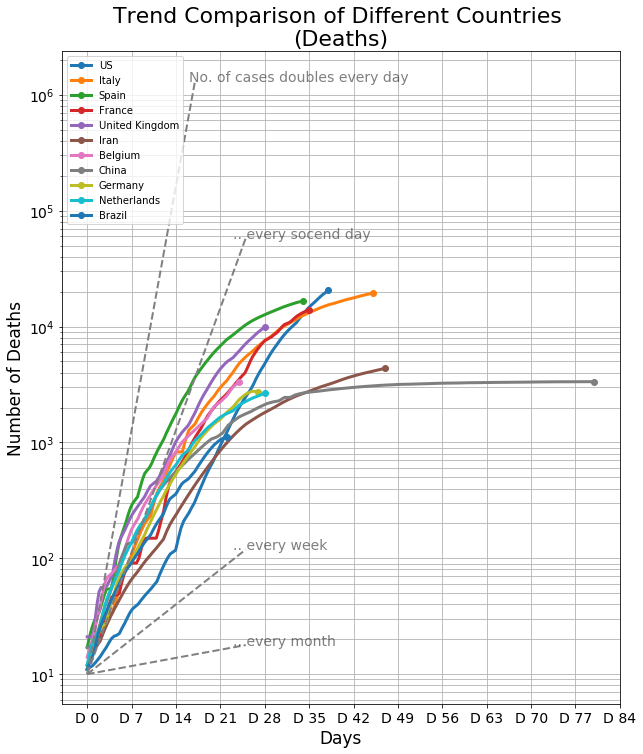

In [0]:
temp = deaths.groupby('country').sum().drop(["Lat","Long"],axis =1).sort_values(deaths.columns[-1], ascending= False)

threshold = 10
f = plt.figure(figsize=(10,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    if i > 10:
        break
    x = 91
    t = temp.loc[temp.index== country].values[0]
    t = t[t>threshold][:x]
     
    date = np.arange(0,len(t[:x]))
    xnew = np.linspace(date.min(), date.max(), 91)
    spl = make_interp_spline(date, t, k=1)  # type: BSpline
    power_smooth = spl(xnew)
    plt.plot(xnew,power_smooth,'-o',label = country,linewidth =3, markevery=[-1])


plt.tick_params(labelsize = 14)        
plt.xticks(np.arange(0,91,7),[ "D "+str(i) for i in range(91)][::7])     

# Reference lines 
x = np.arange(0,18)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,26)
y = 2**(x/2+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every socend day",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,26)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every week",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,26)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every month",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

# plot Params
plt.xlabel("Days",fontsize=17)
plt.ylabel("Number of Deaths",fontsize=17)
plt.title("Trend Comparison of Different Countries \n(Deaths)",fontsize=22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
#plt.savefig(out+'Trend Comparison countries deaths.png')
plt.show()

USA
foreacasting model

In [0]:
data= pd.read_csv("train.csv")
test = pd.read_csv("test.csv")  

In [0]:
from scipy.optimize import curve_fit

from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima_model import ARIMA
from random import random
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from tqdm import tqdm

def RMSLE(pred,actual):
    return np.sqrt(np.mean(np.power((np.log(pred+1)-np.log(actual+1)),2)))

In [0]:
pd.set_option('mode.chained_assignment', None)
test = pd.read_csv("/kaggle/input/covid19-global-forecasting-week-3/test.csv")
train = pd.read_csv("/kaggle/input/covid19-global-forecasting-week-3/train.csv")
train['Province_State'].fillna('', inplace=True)
test['Province_State'].fillna('', inplace=True)
train['Date'] =  pd.to_datetime(train['Date'])
test['Date'] =  pd.to_datetime(test['Date'])
train = train.sort_values(['Country_Region','Province_State','Date'])
test = test.sort_values(['Country_Region','Province_State','Date'])

In [0]:
train.shape

In [0]:
train.head()

In [0]:
train.info()

Fixing errors

In [0]:
train[['ConfirmedCases', 'Fatalities']] = train.groupby(['Country_Region', 'Province_State'])[['ConfirmedCases', 'Fatalities']].transform('cummax') 

forecast with BayesianRidge

In [0]:
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

feature_day = [1,20,50,100,200,500,1000]
def CreateInput(data):
    feature = []
    for day in feature_day:
        #Get information in train data
        data.loc[:,'Number day from ' + str(day) + ' case'] = 0
        if (train[(train['Country_Region'] == country) & (train['Province_State'] == province) & (train['ConfirmedCases'] < day)]['Date'].count() > 0):
            fromday = train[(train['Country_Region'] == country) & (train['Province_State'] == province) & (train['ConfirmedCases'] < day)]['Date'].max()        
        else:
            fromday = train[(train['Country_Region'] == country) & (train['Province_State'] == province)]['Date'].min()       
        for i in range(0, len(data)):
            if (data['Date'].iloc[i] > fromday):
                day_denta = data['Date'].iloc[i] - fromday
                data['Number day from ' + str(day) + ' case'].iloc[i] = day_denta.days 
        feature = feature + ['Number day from ' + str(day) + ' case']
    
    return data[feature]
pred_data_all = pd.DataFrame()
with tqdm(total=len(train['Country_Region'].unique())) as pbar:
    for country in train['Country_Region'].unique():
        for province in train[(train['Country_Region'] == country)]['Province_State'].unique():
            df_train = train[(train['Country_Region'] == country) & (train['Province_State'] == province)]
            df_test = test[(test['Country_Region'] == country) & (test['Province_State'] == province)]
            X_train = CreateInput(df_train)
            y_train_confirmed = df_train['ConfirmedCases'].ravel()
            y_train_fatalities = df_train['Fatalities'].ravel()
            X_pred = CreateInput(df_test)

            # Define feature to use by X_pred
            feature_use = X_pred.columns[0]
            for i in range(X_pred.shape[1] - 1,0,-1):
                if (X_pred.iloc[0,i] > 0):
                    feature_use = X_pred.columns[i]
                    break
            idx = X_train[X_train[feature_use] == 0].shape[0]          
            adjusted_X_train = X_train[idx:][feature_use].values.reshape(-1, 1)
            adjusted_y_train_confirmed = y_train_confirmed[idx:]
            adjusted_y_train_fatalities = y_train_fatalities[idx:] #.values.reshape(-1, 1)
              
            adjusted_X_pred = X_pred[feature_use].values.reshape(-1, 1)

            model = make_pipeline(PolynomialFeatures(2), BayesianRidge())
            model.fit(adjusted_X_train,adjusted_y_train_confirmed)                
            y_hat_confirmed = model.predict(adjusted_X_pred)

            model.fit(adjusted_X_train,adjusted_y_train_fatalities)                
            y_hat_fatalities = model.predict(adjusted_X_pred)

            pred_data = test[(test['Country_Region'] == country) & (test['Province_State'] == province)]
            pred_data['ConfirmedCases_hat'] = y_hat_confirmed
            pred_data['Fatalities_hat'] = y_hat_fatalities
            pred_data_all = pred_data_all.append(pred_data)
        pbar.update(1)
    
df_val = pd.merge(pred_data_all,train[['Date','Country_Region','Province_State','ConfirmedCases','Fatalities']],on=['Date','Country_Region','Province_State'], how='left')
df_val.loc[df_val['Fatalities_hat'] < 0,'Fatalities_hat'] = 0
df_val.loc[df_val['ConfirmedCases_hat'] < 0,'ConfirmedCases_hat'] = 0

df_val_1 = df_val.copy()

In [0]:
RMSLE(df_val[(df_val['ConfirmedCases'].isnull() == False)]['ConfirmedCases'].values,df_val[(df_val['ConfirmedCases'].isnull() == False)]['ConfirmedCases_hat'].values)

In [0]:
RMSLE(df_val[(df_val['Fatalities'].isnull() == False)]['Fatalities'].values,df_val[(df_val['Fatalities'].isnull() == False)]['Fatalities_hat'].values)

In [0]:
val_score = []
for country in df_val['Country_Region'].unique():
    df_val_country = df_val[(df_val['Country_Region'] == country) & (df_val['Fatalities'].isnull() == False)]
    val_score.append([country, RMSLE(df_val_country['ConfirmedCases'].values,df_val_country['ConfirmedCases_hat'].values),RMSLE(df_val_country['Fatalities'].values,df_val_country['Fatalities_hat'].values)])
    
df_val_score = pd.DataFrame(val_score) 
df_val_score.columns = ['Country','ConfirmedCases_Scored','Fatalities_Scored']
df_val_score.sort_values('ConfirmedCases_Scored', ascending = False)